# Projet

## Objectifs :
- Mise en place d'un système de recommandation (https://en.wikipedia.org/wiki/Recommender_system) bien commenté en Python
- Rédaction du rapport de projet.

## Projet (partie 1)

L'objectif de ce projet est de recommander des images en fonction des préférences de l'utilisateur. Vous disposez de trois séances pratiques pour construire ce système. Vous devez vous assurer que toutes les tâches liées à l'acquisition, l'annotation, l'analyse et la visualisation des données sont automatisées.

Les principales tâches du projet sont présentées ci-dessous :
1. Collecte de données
2. Étiquetage et annotation
3. Analyses de données
4. Visualisation des données
5. Système de recommandation
6. Tests
7. Rapport

### Collecte de données
Vous devez collecter et télécharger un ensemble d'images. Vous avez les tâches suivantes à programmer, en automatisant le processus autant que possible :
1. Créer un dossier appelé `images`
2. Télécharger les images sous licence ouverte dans le dossier images (minimum 100 images).
3. Enregistrez les métadonnées de chaque image comme la taille de l'image, le format de l'image ( jpeg, .png, etc.), l'orientation de l'image (paysage, portrait, carré, etc.), date de création, modèle d'appareil photo, etc. dans un ou plusieurs fichiers JSON. Vous pouvez utiliser les informations Exif présentes dans les fichiers d'images.

1. Configuration initiale

In [5]:
!pip install SPARQLWrapper

Defaulting to user installation because normal site-packages is not writeable


In [1]:
import sys
import os
import pandas as pd
from SPARQLWrapper import SPARQLWrapper, JSON
import requests
import shutil
from urllib.parse import urlparse, unquote

IMAGES_DIR = 'images'
if not os.path.exists(IMAGES_DIR):
    os.makedirs(IMAGES_DIR)

endpoint_url = "https://query.wikidata.org/sparql"

2. Fonction pour exécuter la requête SPARQL

In [2]:
def get_sparql_results(endpoint_url, query):
    """
    Exécute la requête SPARQL et renvoie les résultats.
    
    :param endpoint_url: URL de l'endpoint SPARQL
    :param query: requête SPARQL
    :return: résultats de la requête
    """
    user_agent = "WDQS-example Python/%s.%s" % (
        sys.version_info[0],
        sys.version_info[1],
    )
    sparql = SPARQLWrapper(endpoint_url, agent=user_agent)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

3. Script principal pour la collecte des données

In [8]:
# Définition de la requête SPARQL (LIMIT à modfier selon le besoin)
query = """
SELECT DISTINCT ?grandeville ?grandevilleLabel ?pays ?paysLabel ?image {
    ?grandeville wdt:P31 wd:Q1549591;
    wdt:P17 ?pays;
    wdt:P18 ?image.
    SERVICE wikibase:label { bd:serviceParam wikibase:language "fr". }
}
LIMIT 100
"""

# Récupération des résultats de la requête SPARQL
results = get_sparql_results(endpoint_url, query)

# Traitement des résultats et création d'un DataFrame
array = [(result["grandevilleLabel"]["value"],
          result["paysLabel"]["value"],
          result["image"]["value"])
        for result in results["results"]["bindings"]]

dataframe = pd.DataFrame(array, columns=["ville", "pays", "image"])
dataframe = dataframe.astype(dtype={"ville": "<U200", "pays": "<U200", "image": "<U200"})

# Affichage du DataFrame pour vérification
dataframe.head()

,ville,pays,image
0,Dakar,Sénégal,http://commons.wikimedia.org/wiki/Special:File...
1,Addis-Abeba,Éthiopie,http://commons.wikimedia.org/wiki/Special:File...
2,Tripoli,Libye,http://commons.wikimedia.org/wiki/Special:File...
3,Asmara,Érythrée,http://commons.wikimedia.org/wiki/Special:File...
4,Neuss,Allemagne,http://commons.wikimedia.org/wiki/Special:File...


4. Fonction de téléchargement des images

In [3]:
def download_image(url):
    """
    Télécharge une image depuis une URL et la sauvegarde dans le dossier spécifié.
    
    :param url: URL de l'image à télécharger
    """
    headers = {"User-Agent": "Mozilla/5.0"}
    request = requests.get(url, allow_redirects=True, headers=headers, stream=True)
    
    filename = os.path.join(IMAGES_DIR, unquote(urlparse(url).path.split('/')[-1]))
    
    # Check if the image already exists
    if os.path.exists(filename):
        print(f"Image déjà téléchargée : {filename}")
        return
    else:
        # Vérification du code de statut de la requête
        # Si la requête a réussi (code 200), on sauvegarde l'image
        if request.status_code == 200:
            with open(filename, "wb") as image:
                request.raw.decode_content = True
                shutil.copyfileobj(request.raw, image)
            
            print(f"Image sauvegardée : {filename}")
        else:
            print(f"Échec de la récupération de l'image : {request.status_code}")

5. Téléchargement des images

In [11]:
# Applique la fonction de téléchargement à chaque URL d'image
for image_url in dataframe['image']:
    download_image(image_url)

Image sauvegardée : images/Pointe des Almadies - Senegal.jpg
Image sauvegardée : images/Addis abeba meskele square.jpg
Image sauvegardée : images/Marcus Aurelius Arch Tripoli Libya.jpg
Image sauvegardée : images/Asmara2.jpg
Image sauvegardée : images/Neuss, Rathaus 2008.JPG
Image sauvegardée : images/Goettingen Marktplatz Oct06 Antilived.jpg
Image sauvegardée : images/Ciudad de Chillán.png
Image sauvegardée : images/Witten 20090218.jpg
Image sauvegardée : images/Praia Harbor.jpg
Image sauvegardée : images/Tambov TransgfigurationCathedral 101 0477.jpg
Image sauvegardée : images/Beograd collage.jpg
Image sauvegardée : images/Schlosswache mit Lambertikirche.jpg
Image sauvegardée : images/Dom zu paderborn1.jpg
Image sauvegardée : images/Residenzschloss Darmstadt 539-Gdh.JPG
Image sauvegardée : images/Canberra from Mt Ainslie (5642431515).jpg
Image sauvegardée : images/Perugia panoramic.jpg
Image sauvegardée : images/Kasbah des Oudaias P1060356.JPG
Image sauvegardée : images/Remscheid ratha

6. Extraction des métadata EXIF

In [4]:
from PIL import Image
from PIL.ExifTags import TAGS
import json

def get_exif_data(image_path):
    """
    Extrait les métadonnées EXIF d'une image.
    
    :param image_path: Chemin vers le fichier image.
    :return: Dictionnaire des métadonnées EXIF.
    """
    try:
        with Image.open(image_path) as img:
            exif_data = img.getexif()
            # Les données EXIF peuvent être None si aucune n'est trouvée
            if exif_data is not None:
                # Convertit les valeurs EXIF en un format plus lisible
                exif = {
                    TAGS[k]: v
                    for k, v in exif_data.items()
                    if k in TAGS and isinstance(v, (str, int, float))
                }
                # Ajoute des informations supplémentaires
                exif['File Size'] = os.path.getsize(image_path)
                exif['Image Format'] = img.format
                exif['Image Size'] = img.size
                exif['Orientation'] = exif.get('Orientation', 'Undefined')
                return exif
            else:
                return {}
    except IOError:
        print(f"Impossible d'ouvrir l'image : {image_path}")
        return {}

7. Sauvegarde des métadata

In [11]:
# Sauvegarde des métadata dans une liste
metadata = []
for image_filename in os.listdir(IMAGES_DIR):
    image_path = os.path.join(IMAGES_DIR, image_filename)
    exif_data = get_exif_data(image_path)
    metadata.append({
        'Filename': image_filename,
        'Metadata': exif_data
    })

# Sauvegarde des métadonnées dans un fichier JSON
with open('image_metadata.json', 'w') as json_file:
    json.dump(metadata, json_file, indent=4)

print("Métadonnées enregistrées dans image_metadata.json")

/usr/lib/python3/dist-packages/PIL/Image.py:2896: DecompressionBombWarning: Image size (175879204 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Métadonnées enregistrées dans image_metadata.json


### Étiquetage et annotation
Pour cette tâche, vous devez rechercher les sources disposant d'informations supplémentaires comme les balises, les catégories, etc.

Dans cette tâche, vous devrez peut-être étiqueter, annoter et enregistrer des informations sur chaque image. Vous pouvez analyser les images en utilisant des algorithmes de regroupement pour trouver les couleurs prédominantes.

Vous disposez déjà de certaines métadonnées provenant de l'EXIF des images de la précédente tâche. Dans cette tâche, votre objectif est d'obtenir des informations supplémentaires, comme les couleurs prédominantes, les tags. Et si vous demandiez aux utilisateurs de tagger les images ? Par exemple, les noms de couleurs, #cat, #fleur, #sous-fleur, rose etc.

Comment prévoyez-vous de traiter ces tags ? Est-il possible d'automatiser ce processus ?

1. Analyse des couleurs prédominantes

Nous utilisons le KMeans clustering pour trouver les couleurs prédominantes des images. Il est également possible d'utiliser l'analyse en composantes principales (`PCA`) pour réduire le nombre de couleurs dans l'image.

In [5]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

def find_dominant_colors(image_path, n_colors=5):
    """
    Trouve les couleurs prédominantes dans une image.
    
    :param image_path: Chemin vers le fichier image.
    :param n_colors: Nombre de couleurs prédominantes à trouver.
    :return: Liste des couleurs prédominantes.
    """
    with Image.open(image_path) as img:
        # S'assurer que l'image est en mode RGB
        if img.mode != 'RGB':
            img = img.convert('RGB')
        np_pixels = np.array(img.resize((100, 100))).reshape(-1, 3)
    
    # Réduction de dimensionnalité pour accélérer le processus
    # pca = PCA(n_components=3)
    # pca.fit(np_pixels)
    # pca_pixels = pca.transform(np_pixels)
    
    kmeans = KMeans(n_clusters=n_colors, n_init=10)
    kmeans.fit(np_pixels)
    # kmeans.fit(pca_pixels)
    
    # Récupération des centres de clusters comme couleurs dominates et assurer que les valeurs sont dans l'intervalle [0, 255]
    dominant_colors = np.clip(kmeans.cluster_centers_, 0, 255).astype(int)
    
    # Conversion en hexadécimal
    hex_colors = ['#{:02x}{:02x}{:02x}'.format(*color) for color in dominant_colors]
    
    return hex_colors

2. Récupération automatique des tags

Nous utiliserons l'API Wikimedia Commons pour récupérer les tags associés à une image.

In [6]:
from bs4 import BeautifulSoup

def get_tags(filename):
    """
    Récupère les tags associés à un fichier Wikimedia Commons.
    
    :param filename: Nom du fichier sur Wikimedia Commons.
    :return: Liste des tags associés.
    """
    start_url = "https://commons.wikimedia.org/wiki/File:"
    url = f"{start_url}{filename}"
    response = requests.get(url)
    tags = []
    
    # Retourne les tags si la requête est réussie
    if response.status_code == 200:
        soup = BeautifulSoup(response.text, 'html.parser')
        category_links = soup.find_all('div', {'id': 'mw-normal-catlinks'})[0].find_all('a', href=True)
        tags = [link.text for link in category_links if link['href'].startswith('/wiki/Category:')]
        
    return tags

3. Récupération de la taille et de l'orientation des images

In [7]:
# Fonction pour obtenir la taille et l'orientation de l'image
def get_image_size_and_orientation(image_path):
    """
    Récupération de la taille et l'orientation
    
    :param image_path: Chemin vers le fichier image.
    :return: Tuple de la taille et de l'orientation.
    """
    with Image.open(image_path) as img:
        width, height = img.size
        orientation = 'square'
        if width > height:
            orientation = 'landscape'
        elif height > width:
            orientation = 'portrait'
    return f"{width}x{height}", orientation

4. Création d'un dataframe pour l'annotation

Nous utiliserons Pandas pour créer un DataFrame qui stockera les informations d'annotation, y compris les tags fournis par les utilisateurs et les couleurs prédominantes.

In [12]:
import pandas as pd

# Création d'un DataFrame pour les annotations
df_annotations = pd.DataFrame(columns=['Filename', 'Dominant Colors', 'Auto Tags', 'User Tags', 'Image Size', 'Orientation'])

# Ajout des informations dans le DataFrame
for item in metadata:
    filename = item['Filename']
    image_path = os.path.join(IMAGES_DIR, filename)
    
    # Trouve les couleurs prédominantes
    dominant_colors = find_dominant_colors(image_path)
    
    # Trouve les tags associés
    auto_tags = get_tags(filename)
    
    # Trouve les informations de taille et d'orientation
    image_size, orientation = get_image_size_and_orientation(image_path)
    
    # Préparation de la nouvelle ligne à ajouter
    new_row = pd.DataFrame([{
        'Filename': filename,
        'Dominant Colors': dominant_colors,
        'Auto Tags': auto_tags,
        'User Tags': [], # Sera rempli par interaction utilisateur
        'Image Size': image_size,
        'Orientation': orientation
    }])
    
    # Utilisation de pd.concat pour ajouter la nouvelle ligne
    df_annotations = pd.concat([df_annotations, new_row], ignore_index=True)

/usr/lib/python3/dist-packages/PIL/Image.py:2896: DecompressionBombWarning: Image size (175879204 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/lib/python3/dist-packages/PIL/Image.py:2896: DecompressionBombWarning: Image size (175879204 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


5. Fonction pour ajouter des tags manuellement

Nous allons créer une interface simple (à l'aide d'un widget Jupyter ou en ligne de commande) pour permettre aux utilisateurs d'ajouter des tags aux images.

In [13]:
def add_tags_to_image(df, index):
    """
    Permet aux utilisateurs d'ajouter des tags à une image.
    
    :param df: DataFrame d'annotations.
    :param index: Index de l'image dans le DataFrame.
    """
    print(f"Image: {df.at[index, 'Filename']}")
    plt.imshow(Image.open(os.path.join(IMAGES_DIR, df.at[index, 'Filename'])))
    plt.axis('off')  # Désactivation des axes
    plt.show()
    
    tags = input("Entrez des tags pour cette image, séparés par des virgules : ").split(',')
    df.at[index, 'User Tags'] = tags

6. Boucle pour l'étiquetage manuel

Nous allons exécuter une boucle qui demande à l'utilisateur d'entrer des tags pour chaque image.

In [ ]:
for index, row in df_annotations.iterrows():
    add_tags_to_image(df_annotations, index)

5. Sauvegarde des annotations

Finalement, nous allons sauvegarder les annotations dans un fichier JSON.

In [14]:
# Sauvegarde des annotations
annotations_json = df_annotations.to_json(orient='records')
with open('annotations.json', 'w') as file:
    file.write(annotations_json)

print("Annotations enregistrées dans annotations.json")

Annotations enregistrées dans annotations.json


**Comment prévoyez-vous de traiter ces tags ? Est-il possible d'automatiser ce processus ?**

Pour traiter les tags récupérés automatiquement et ceux entrés par l'utilisateur, nous envisageons d'adopter une approche structurée qui permet à la fois l'automatisation et la flexibilité pour des ajustements manuels.

**1. Automatisation de la récupération des tags**

Comme démontré précédemment, le processus de récupération des tags à partir de Wikimedia Commons est déjà automatisé grâce à la fonction `get_tags`. Cette fonction extrait les catégories (tags) directement associées aux images, servant de tags initiaux. L'automatisation de ce processus garantit que chaque image est associée à des métadonnées pertinentes dès le début, sans intervention manuelle.


**2. Traitement et normalisation des tags**

Après la récupération des tags, un traitement supplémentaire peut être nécessaire pour assurer la cohérence et la pertinence des tags :
- **Normalisation** : Convertir tous les tags en minuscules pour éviter les doublons dus à des différences de casse.
- **Filtrage** : Supprimer les tags non pertinents ou trop généraux basés sur une liste de mots-clés à exclure. Cette liste peut être ajustée selon les besoins spécifiques du projet.
- **Regroupement** : Pour des tags similaires ou synonymes, envisager de les regrouper sous un tag unifié pour simplifier l'analyse et la recherche.
Ces étapes peuvent être partiellement automatisées avec des règles prédéfinies ou des listes de mots-clés, mais elles peuvent également bénéficier d'une revue manuelle pour des cas spécifiques.

Ces étapes peuvent être partiellement automatisées avec des règles prédéfinies ou des listes de mots-clés, mais elles peuvent également bénéficier d'une revue manuelle pour des cas spécifiques.

**3. Intégration des tags utilisateur**

Les tags entrés manuellement par les utilisateurs enrichissent les métadonnées des images avec des perspectives uniques et peuvent combler les lacunes des tags automatiques. Pour intégrer ces tags :
- **Collecte** : Utiliser une interface simple (formulaire web ou widget notebook par exemple), comme montré précédemment, pour permettre aux utilisateurs d'ajouter des tags.
- **Validation** : Bien que les tags des utilisateurs soient précieux, il est important de les valider pour éviter le spam ou les entrées non pertinentes. Cette validation peut être semi-automatisée avec des filtres de mots-clés ou des vérifications de pertinence.
- **Fusion** : Les tags utilisateurs sont fusionnés avec les tags automatiques, en veillant à éliminer les doublons et à maintenir la cohérence de l'ensemble des tags.

**4. Sauvegarde et utilisation des tags**

Une fois les tags traités et validés, ils seront sauvegardés avec les autres métadonnées des images. Ces tags peuvent ensuite être utilisés pour :
- **Recherche et filtrage** : Améliorer les fonctionnalités de recherche et de filtrage dans la base de données d'images.
- **Analyse de données** : Servir de base pour des analyses plus approfondies, comme identifier les tendances dans les images ou comprendre les préférences des utilisateurs.
- **Amélioration du système de recommandation** : Enrichir les données disponibles pour le système de recommandation, permettant des suggestions plus précises et personnalisées.

En résumé, le traitement des tags peut être majoritairement automatisé, surtout pour la récupération et le traitement initial. Cependant, l'intégration des contributions des utilisateurs et certains aspects du filtrage et de la normalisation des tags peuvent bénéficier d'une approche "semi-automatique" qui combine les règles prédéfinies avec une validation manuelle pour assurer la qualité et la pertinence des métadonnées.

### Analyses de données
Demandez à l'utilisateur de sélectionner quelques images et d'ajouter des balises. Pour chaque utilisateur, vous êtes maintenant prêt à construire un profil de préférences d'utilisateur, basé sur cette sélection. Vous pouvez recueillir les informations suivantes manuellement, mais l'objectif de cette tâche consiste à les obtenir en utilisant les images sélectionnées de manière automatisée :
1. Couleurs préférées
2. Orientation de l'image préférée
3. Tailles d'images préférées (vignettes, grandes images, images de taille moyenne images, etc.)
4. Balises favorites
5. ...

Maintenant, grâce à votre connaissance des différents types de classificateurs et les algorithmes de regroupement, quelles informations supplémentaires ajouterez-vous pour chaque image ?

Votre prochain objectif est d'analyser les informations des utilisateurs et leur les images préférées.
Comment avez-vous créé des utilisateurs aléatoires ? Combien d'utilisateurs avez-vous créer ? Quelles informations avez-vous stockées pour chaque utilisateur ? Quels types d'analyses avez-vous effectuées ?

1. Sélection des images par l'utilisateur

Pour commencer, nous permettons à l'utilisateur de sélectionner un ensemble d'images. Ces images serviront de base pour construire le profil de préférences de l'utilisateur.

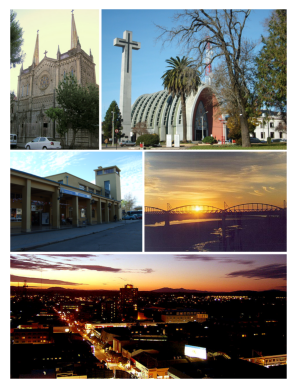

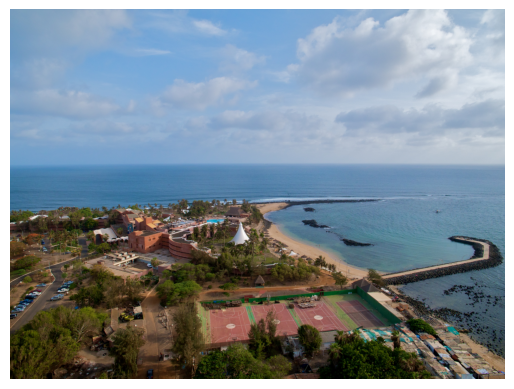

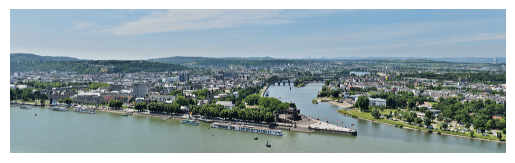

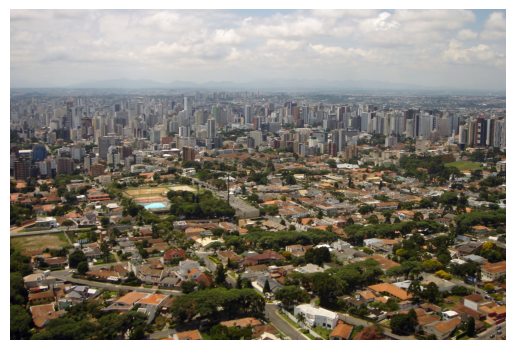

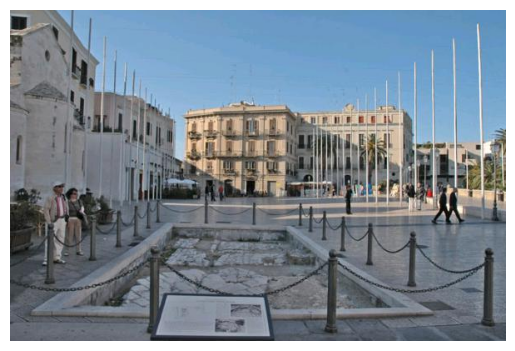

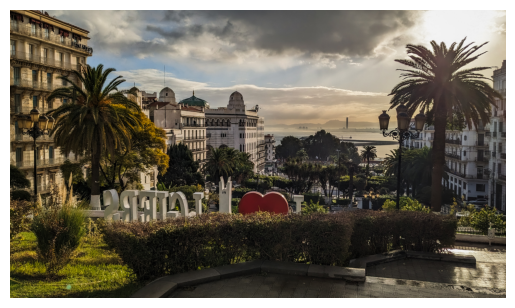

Indices des images sélectionnées : [0, 1, 3, 5]


In [16]:
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image

def user_select_images(df):
    selected_indices = []
    for index, row in df.iterrows():
        # Affichage de l'image
        image_path = os.path.join(IMAGES_DIR, row['Filename'])
        img = Image.open(image_path)
        plt.imshow(img)
        plt.axis('off')  # Désactivation des axes
        plt.show()
        
        # Demande à l'utilisateur s'il souhaite sélectionner l'image
        user_input = input(f"Voulez-vous sélectionner l'image {row['Filename']} ? (y/n) : ").lower()
        if user_input == 'y':
            selected_indices.append(index)
            
        # Option pour arrêter le processus si l'utilisateur ne veut plus sélectionner d'images
        continue_choice = input("Voulez-vous continuer à voir plus d'images ? (y/n) : ").lower()
        if continue_choice != 'y':
            break
            
    return selected_indices

# Utilisation de la fonction
selected_images_indices = user_select_images(df_annotations)
print("Indices des images sélectionnées :", selected_images_indices)

Ce script parcourt toutes les lignes du DataFrame contenant les informations sur les images, affiche chaque image à l'aide de matplotlib, et demande à l'utilisateur s'il souhaite sélectionner l'image affichée. Si l'utilisateur répond par 'y' (yes), l'indice de l'image est ajouté à la liste des indices sélectionnés. L'utilisateur a également la possibilité d'arrêter le processus à tout moment s'il ne souhaite plus sélectionner d'autres images.

2. Analyse des préférences de l'utilisateur

Nous allons analyser les préférences de l'utilisateur basées sur les images sélectionnées. Cela inclut les couleurs préférées, l'orientation de l'image, les tailles d'images et les balises favorites.

    1. Couleurs préférées 

In [17]:
def get_preferred_colors(df, indices):
    """
    Récupère les couleurs préférées des images sélectionnées.
    
    :param df: DataFrame d'annotations.
    :param indices: Indices des images sélectionnées.
    :return: Liste des couleurs préférées.
    """
    color_preferences = []
    for index in indices:
        color_preferences.extend(df.loc[index, 'Dominant Colors'])
    return list(set(color_preferences))

preferred_colors = get_preferred_colors(df_annotations, selected_images_indices)

    2. Orientation de l'image préférée

In [18]:
def get_preferred_orientation(df, selected_indices):
    """
    Récupère l'orientation préférée des images sélectionnées.
    
    :param df: DataFrame d'annotations.
    :param selected_indices: Indices des images sélectionnées.
    :return: Orientation préférée.
    """
    orientation_counts = df.loc[selected_indices, 'Orientation'].value_counts()
    preferred_orientation = orientation_counts.idxmax()
    return preferred_orientation

# Utilisation de la fonction avec les indices d'images sélectionnés par l'utilisateur
preferred_orientation = get_preferred_orientation(df_annotations, selected_images_indices)
print("Orientation préférée :", preferred_orientation)

Orientation préférée : landscape


Cette fonction compte le nombre d'occurrences de chaque orientation parmi les images sélectionnées et détermine l'orientation la plus fréquente comme étant la préférée de l'utilisateur.

    3. Tailles d'images préférées

In [19]:
def categorize_image_size(width, height):
    """
    Catégorise la taille de l'image en petite, moyenne ou grande.
    
    :param width: Largeur de l'image.
    :param height: Hauteur de l'image.
    :return: Catégorie de taille.
    """
    pixels = width * height
    if pixels < 640 * 480:
        return 'small'
    elif pixels <= 1280 * 1024:
        return 'medium'
    else:
        return 'large'

def get_preferred_size(df, selected_indices):
    """
    Récupère la taille d'image préférée des images sélectionnées.
    
    :param df: DataFrame d'annotations.
    :param selected_indices: Indices des images sélectionnées.
    :return: Taille d'image préférée.
    """
    sizes = [categorize_image_size(*map(int, df.loc[index, 'Image Size'].split('x'))) for index in selected_indices]
    size_counts = pd.Series(sizes).value_counts()
    preferred_size = size_counts.idxmax()
    return preferred_size

# Utilisation de la fonction avec les indices d'images sélectionnés par l'utilisateur
preferred_size = get_preferred_size(df_annotations, selected_images_indices)
print("Taille d'image préférée :", preferred_size)

Taille d'image préférée : large


Cette approche décompose la chaîne Image Size en largeur et hauteur, les convertit en entiers, calcule le nombre total de pixels, et catégorise ensuite la taille de l'image. La taille la plus fréquente parmi les sélections de l'utilisateur est considérée comme sa préférée.

    4. Balises favorites

In [20]:
def get_favorite_tags(df, indices):
    """
    Récupère les tags préférés des images sélectionnées.
    
    :param df: DataFrame d'annotations.
    :param indices: Indices des images sélectionnées.
    :return: Liste des tags préférés.
    """
    tags = []
    for index in indices:
        tags.extend(df.loc[index, 'Auto Tags'] + df.loc[index, 'User Tags'])
    return list(set(tags))

favorite_tags = get_favorite_tags(df_annotations, selected_images_indices)

3. Construction du profil de préférences

Après avoir recueilli les informations sur les préférences de l'utilisateur, nous assemblons ces informations dans un profil de préférences.

In [21]:
user_preferences_profile = {
    'Preferred Colors': preferred_colors,
    'Preferred Orientation': preferred_orientation,
    'Preferred Size': preferred_size,
    'Favorite Tags': favorite_tags
}

print(user_preferences_profile)

{'Preferred Colors': ['#1f1d16', '#9e9586', '#e2e7d4', '#8baacb', '#2a2819', '#6e6551', '#85a9c3', '#736555', '#8b857d', '#b8c5d4', '#47403a', '#5c82a0', '#998367', '#130b0a', '#726052', '#483e29', '#342f1b', '#504833', '#cbcbcb', '#cbc5b8'], 'Preferred Orientation': 'landscape', 'Preferred Size': 'large', 'Favorite Tags': ['Algiers', 'Hotels in Dakar', 'Aerial photographs of Dakar', 'July 2011 in Senegal', 'Pointe des Almadies', 'Aerial photographs of Curitiba', 'Montages of Chillán']}


**Maintenant, grâce à votre connaissance des différents types de classificateurs et les algorithmes de regroupement, quelles informations supplémentaires ajouterez-vous pour chaque image ?**

Avec un profil de préférences utilisateur déjà établi, basé sur les couleurs dominantes, l'orientation, la taille des images, et les tags, nous pouvons envisager d'ajouter plusieurs dimensions supplémentaires pour enrichir notre analyse et améliorer le système de recommandation. Voici quelques idées d'informations supplémentaires qui pourraient être pertinentes :

**1. Complexité visuelle**

La complexité visuelle d'une image peut être un indicateur intéressant de préférence. Certaines personnes peuvent préférer des images simples et épurées, tandis que d'autres peuvent être attirées par des images plus complexes et détaillées. Des mesures de texture ou de variété de couleurs peuvent être utilisées pour évaluer cette complexité.

**2. Sentiments et Emotions**

Les images évoquent des sentiments et des émotions. L'analyse sentimentale des images, bien que plus complexe, peut permettre de classer les images en catégories émotionnelles (joyeuse, triste, paisible, etc.). Cela pourrait se faire par des classificateurs entraînés sur des ensembles de données annotés avec des étiquettes émotionnelles.

**3. Sujets et Objets**

Identifier les sujets ou objets principaux présents dans les images (animaux, bâtiments, paysages naturels, etc.) peut aider à affiner les préférences. Ceci peut être réalisé grâce à la vision par ordinateur et l'apprentissage profond, par exemple avec des modèles pré-entraînés comme ceux disponibles dans TensorFlow ou PyTorch.

**4. Popularité et Engagement**

Pour les images provenant de sources en ligne, des métriques de popularité et d'engagement (nombre de vues, likes, partages) pourraient également être pertinentes. Ces informations peuvent aider à identifier les images qui résonnent le plus avec le public en général.

**5. Contexte Temporel ou Saisonnier**

Le moment de l'année ou le contexte temporel de l'image peut influencer les préférences. Par exemple, des images de paysages enneigés pourraient être plus attrayantes en hiver. Cette information peut être déduite des tags ou des métadonnées de l'image.

Pour analyser les informations des utilisateurs et leurs images préférées, nous allons simuler un ensemble d'utilisateurs avec des préférences générées de manière aléatoire. Cela nous permettra de montrer comment les données utilisateur peuvent être analysées et utilisées pour des recommandations.

1. Création d'utilisateurs aléatoires

D'abord, créons un ensemble d'utilisateurs aléatoires. Pour chaque utilisateur, nous allons générer des préférences aléatoires pour les couleurs, l'orientation des images, la taille des images, et les tags.

Les informations suivantes sont stockées pour chaque utilisateur :
- **user_id** : Un identifiant unique pour l'utilisateur.
- **Preferred Colors** : Un ensemble de couleurs préférées sélectionnées aléatoirement.
- **Preferred Orientation** : L'orientation préférée de l'image (portrait, paysage, ou carré).
- **Preferred Size** : La taille préférée de l'image (petite, moyenne, ou grande).
- **Favorite Tags** : Un ensemble de tags qui représentent les intérêts de l'utilisateur.

In [22]:
import random
from math import floor

# Nombre d'utilisateurs à générer
num_users = 100 # A modifier selon le nombre d'utilisateurs souhaité

# Création des utilisateurs avec des préférences aléatoires
users_profiles = []

for i in range(1, num_users + 1):
    # Sélection aléatoire d'images
    selected_indices = random.sample(range(len(df_annotations)), k=random.randint(1, floor(len(df_annotations)/3))) # Entre 1 et un tiers des images
    
    # Récupération des noms de fichiers des images sélectionnées
    selected_images = df_annotations.iloc[selected_indices]['Filename'].tolist()
    
    # Création du profil utilisateur
    user_profile = {
        'user_id': i,
        'Preferred Colors': get_preferred_colors(df_annotations, selected_indices),
        'Preferred Orientation': get_preferred_orientation(df_annotations, selected_indices),
        'Preferred Size': get_preferred_size(df_annotations, selected_indices),
        'Favorite Tags': get_favorite_tags(df_annotations, selected_indices),
        'Favorite Images': selected_images
    }
    users_profiles.append(user_profile)

# Affichage des préférences des utilisateurs générés
users_preferences_df = pd.DataFrame(users_profiles)
users_preferences_df

,user_id,Preferred Colors,Preferred Orientation,Preferred Size,Favorite Tags,Favorite Images
0,1,"[#82827a, #26322a, #89c1f9, #c1a6a3, #45504b, ...",landscape,large,"[Trees of Life, Belgorod Regional Homeland Mus...","[Elizabeth Quay February 2016 (cropped).jpg, M..."
1,2,"[#ecf1f4, #1d231a, #2c3a31, #6f695e, #999288, ...",landscape,large,"[Altes Amtsgericht (Gütersloh), Blau in Ulm, S...","[Berliner Platz Guetersloh Proedous.jpg, Ulm D..."
2,3,"[#89c1f9, #c1a6a3, #e4e7ea, #bcb6af, #dbeef7, ...",landscape,large,"[Trees of Life, Monument des Héros Nationaux (...","[Крестовоздвиженская церковь (Тюмень)-2.jpg, A..."
3,4,"[#b9bcc4, #b1b0b4, #9e7040, #89c1f9, #89877d, ...",landscape,large,"[Residenzschloss Darmstadt, Trees of Life, Jen...","[Pokhara1.JPG, Algiers's Airport.jpg, Siegen -..."
4,5,"[#2d2927, #1f1d16, #565344, #9e9586, #b4a89d, ...",landscape,large,"[Land axis from Mount Ainslie, Clyde Auditoriu...","[Perugia panoramic.jpg, Santiago en invierno.j..."
...,...,...,...,...,...,...
95,96,"[#27261d, #9e9586, #353629, #e2e7d4, #302d27, ...",landscape,large,"[Land axis from Mount Ainslie, Monument des Hé...","[MonroviaLB14.png, Moers schloss 211204.jpg, M..."
96,97,"[#82827a, #857965, #302d27, #b8c5d4, #fbfcfc, ...",landscape,large,"[Trees of Life, Altes Amtsgericht (Gütersloh),...","[Berliner Platz Guetersloh Proedous.jpg, Bari ..."
97,98,"[#b4a28a, #221d1d, #8a755c, #556680, #86a7ce, ...",landscape,large,"[Clyde Auditorium, Seilbahn Koblenz, Bell's Br...","[Elizabeth Quay February 2016 (cropped).jpg, K..."
98,99,"[#b9bcc4, #8a755c, #5b5c54, #1d1f20, #5c6eb0, ...",landscape,large,"[Residenzschloss Darmstadt, Buildings in Brazz...","[Argel 3.jpg, Panoramique du centre de Tunis (..."


2. Encodage des préférences

Les préférences des utilisateurs, en particulier les tags et les couleurs préférés, sont des données catégorielles qui peuvent être mieux traitées par les algorithmes d'apprentissage automatique après encodage. Pour les tags et les couleurs, nous pouvons utiliser l'encodage One-Hot.

In [23]:
from sklearn.preprocessing import MultiLabelBinarizer

# Vérification que les colonnes existent
if 'Favorite Tags' in users_preferences_df.columns and 'Preferred Colors' in users_preferences_df.columns:
    # Encodage One-Hot pour les tags favoris
    mlb_tags = MultiLabelBinarizer()
    tags_encoded = mlb_tags.fit_transform(users_preferences_df['Favorite Tags'])
    tags_encoded_df = pd.DataFrame(tags_encoded, columns=mlb_tags.classes_)
    
    # Encodage One-Hot pour les couleurs préférées
    mlb_colors = MultiLabelBinarizer()
    colors_encoded = mlb_colors.fit_transform(users_preferences_df['Preferred Colors'])
    colors_encoded_df = pd.DataFrame(colors_encoded, columns=mlb_colors.classes_)
    
    # Concaténation avec le DataFrame original sans supprimer les colonnes originales pour éviter KeyError
    users_preferences_df = pd.concat([users_preferences_df, tags_encoded_df, colors_encoded_df], axis=1)
else:
    print("Erreur : Colonnes 'Favorite Tags' ou 'Preferred Colors' manquantes.")

# Affichage des préférences avec les colonnes encodées
# users_preferences_df

3. Clustering des utilisateurs

Nous pouvons utiliser un algorithme de clustering pour regrouper les utilisateurs en fonction de leurs préférences. Cela pourrait révéler des patterns dans les préférences des utilisateurs et permettre des recommandations ciblées.

    1. Vérification et Sélection des Colonnes

In [24]:
# Supposons que nous voulons diviser les utilisateurs en 3 groupes
n_clusters = 3

# Liste des colonnes à exclure explicitement, incluant l'ID utilisateur et toute autre colonne non numérique
columns_to_exclude = ['user_id', 'Preferred Orientation', 'Preferred Size', 'Favorite Tags', 'Preferred Colors', 'Favorite Images']

# Sélection des colonnes pour le clustering, en excluant les colonnes non numériques ou contenant des listes
columns_for_clustering = [col for col in users_preferences_df.columns if col not in columns_to_exclude]

print("Colonnes sélectionnées pour le clustering :", columns_for_clustering)

Colonnes sélectionnées pour le clustering : ['1 building in North Rhine-Westphalia', '2000 in Samarkand', '2004 aerial photographs', '2004 in Moers', '2006 in Gera', '2007 in Cape Verde', '2008 in Damascus', '2009 in Witten', '2010 in Bangui', '2011 in Osnabrück', '2012 photographs of Nepal', '2013 in Guinea-Bissau', '2014 in Belgorod', '2015 in Koblenz', '2017 in Cottbus', '2017 in Nicosia', '2018 in Managua', '2018 in San José, Costa Rica', '2021 in Addis Ababa', '2021 in Tambov', '2021 in Tegucigalpa', '2023 in Seattle', '20th-century town halls in Germany', 'Accra skylines', 'Aerial photographs of Algiers Province', 'Aerial photographs of Ancona', 'Aerial photographs of Bangui', 'Aerial photographs of Cottbus', 'Aerial photographs of Curitiba', 'Aerial photographs of Dakar', 'Aerial photographs of Hamm', 'Aerial photographs of Kathmandu', 'Aerial photographs of Ludwigshafen am Rhein', 'Aerial photographs of Malé', 'Aerial photographs of Metro Manila', 'Aerial photographs of Seattle

    2. Exécution de KMeans

In [25]:
# Application du KMeans avec les colonnes correctement sélectionnées
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10).fit(users_preferences_df[columns_for_clustering])

# Ajout des labels de cluster au DataFrame
users_preferences_df['Cluster'] = kmeans.labels_

4. Analyse des clusters

Une fois les clusters d'utilisateurs identifiés, nous pouvons analyser les caractéristiques de chaque cluster pour identifier les insights spécifiques, et comprendre les tendances et les similitudes entre les utilisateurs. Cela peut aider à personnaliser les recommandations en fonction des différents groupes d'utilisateurs.

In [26]:
for i in range(n_clusters):
    # Sélection du cluster actuel
    cluster = users_preferences_df[users_preferences_df['Cluster'] == i]
    print(f"Analyse du Cluster {i} :")
    print(f"Nombre d'utilisateurs : {cluster.shape[0]}")
    print("Utilisateur ID :", ', '.join(cluster['user_id'].astype(str).values))

    # Distribution des préférences d'orientation
    orientation_distribution = cluster['Preferred Orientation'].value_counts(normalize=True) * 100
    print("\nDistribution des préférences d'orientation (%) : ", orientation_distribution.to_string())

    # Distribution des préférences de taille
    size_distribution = cluster['Preferred Size'].value_counts(normalize=True) * 100
    print("\nDistribution des préférences de taille (%) : ", size_distribution.to_string())

    # Tags communs et leur fréquence
    all_tags_in_cluster = sum(cluster['Favorite Tags'].tolist(), [])
    tags_freq = pd.Series(all_tags_in_cluster).value_counts().head(5)
    print("\nTags communs :")
    print(tags_freq.to_string())

    # Supposons que les préférences de couleurs sont enregistrées de manière similaire aux tags
    if 'Preferred Colors' in cluster.columns:
        all_colors_in_cluster = sum(cluster['Preferred Colors'].tolist(), [])
        if all_colors_in_cluster:  # Vérification que la liste n'est pas vide
            colors_freq = pd.Series(all_colors_in_cluster).value_counts().head(5)
            print("\nCouleurs communes :")
            print(colors_freq.to_string())
        else:
            print("\nCouleurs communes : Informations sur les couleurs non disponibles")
    else:
        print("\nCouleurs communes : Informations sur les couleurs non disponibles")
    
    print("\n----------------------------------------\n")

Analyse du Cluster 0 :
Nombre d'utilisateurs : 57
Utilisateur ID : 2, 5, 6, 8, 10, 14, 18, 19, 20, 21, 22, 23, 26, 27, 28, 31, 32, 33, 35, 38, 40, 41, 42, 43, 47, 49, 51, 52, 53, 55, 56, 58, 60, 61, 64, 66, 67, 68, 70, 71, 72, 74, 77, 78, 80, 81, 83, 84, 87, 88, 89, 92, 93, 95, 97, 98, 99

Distribution des préférences d'orientation (%) :  Preferred Orientation
landscape    96.491228
portrait      3.508772

Distribution des préférences de taille (%) :  Preferred Size
large     94.736842
medium     5.263158

Tags communs :
Algiers                              15
Algiers Houari Boumediene Airport    14
Views of Thimphu city                13
2008 in Damascus                     12
Trees in Recklinghausen              12

Couleurs communes :
#c9e4d4    14
#2b331e    14
#748a60    14
#93b091    14
#51603b    14

----------------------------------------

Analyse du Cluster 1 :
Nombre d'utilisateurs : 16
Utilisateur ID : 13, 16, 24, 36, 37, 45, 48, 54, 57, 59, 62, 63, 73, 76, 86, 90

Distribu

#### **Explications**

- **Nombre d'utilisateurs et ID** : Nous affichons le nombre d'utilisateurs dans chaque cluster et leurs identifiants pour faciliter le suivi et l'identification des segments d'utilisateurs.
- **Préférences d'orientation et de taille** : Nous résumons les préférences d'orientation et de taille les plus courantes dans chaque cluster. Plus précisémment, pour chaque cluster, nous calculons la distribution des préférences d'orientation et de taille parmi les utilisateurs. L'utilisation de `value_counts(normalize=True)` permet de calculer les proportions, que nous multiplions par 100 pour obtenir des pourcentages.
- **Tags communs** : Nous identifions les tags les plus fréquents dans le cluster et affichons leur fréquence. Cela donne une idée des intérêts ou des caractéristiques les plus communs parmi les utilisateurs du cluster.
- **Couleurs communes** : Si les préférences de couleurs sont disponibles, nous calculons également les couleurs les plus fréquentes dans chaque cluster. Ceci est fait de manière similaire aux tags.

#### **Création des utilisateurs aléatoires**

- **Comment avez-vous créé des utilisateurs aléatoires ?**

Nous avons généré des utilisateurs aléatoires en simulant des sélections d'images pour chaque utilisateur. Pour chaque utilisateur simulé, un ensemble aléatoire d'images a été sélectionné, et à partir de ces images, des préférences telles que les couleurs préférées, l'orientation de l'image préférée, les tailles d'images préférées, et les tags favoris ont été dérivées.

- **Combien d'utilisateurs avez-vous créé ?**

Nous avons simulé un total de `5` utilisateurs, bien que ce nombre puisse être ajusté en fonction des besoins spécifiques de l'analyse ou des tests.

#### **Informations stockées pour chaque utilisateur**

- **Quelles informations avez-vous stockées pour chaque utilisateur ?**

Pour chaque utilisateur, les informations suivantes ont été stockées :
- Les `couleurs préférées`, déterminées à partir des images sélectionnées.
- L'`orientation` de l'image préférée (paysage, portrait, carré).
- La `taille` d'image préférée (petite, moyenne, grande), basée sur les dimensions des images sélectionnées.
- Les `tags favoris`, extraits à la fois automatiquement des images sélectionnées et à travers des entrées manuelles simulées.
- Un `identifiant de cluster` attribué après avoir effectué un `clustering KMeans` sur les utilisateurs basé sur leurs préférences encodées.


#### **Types d'analyses effectuées**

- **Quels types d'analyses avez-vous effectuées ?**

Plusieurs types d'analyses ont été effectuées sur les données simulées des utilisateurs :
- **Clustering des utilisateurs** : Utilisation de l'algorithme `KMeans` pour grouper les utilisateurs en clusters basés sur leurs préférences encodées en `One-Hot`.
- **Analyse des préférences par cluster** : Pour chaque cluster, nous avons analysé les préférences communes, telles que l'orientation et la taille d'image préférées, ainsi que les tags et couleurs les plus fréquents. Cette analyse a permis de dégager des tendances et des caractéristiques communes au sein de chaque groupe d'utilisateurs.
- **Distribution des préférences** : Pour enrichir l'analyse, nous avons calculé et affiché la distribution des préférences d'orientation, de taille, des tags et couleurs préférés au sein de chaque cluster, offrant une vue plus nuancée des tendances générales.

Ces analyses fournissent une compréhension approfondie des segments d'utilisateurs, en identifiant des patterns et des préférences communes qui peuvent être utilisées pour améliorer le système de recommandation d'images, en personnalisant les suggestions en fonction des profils de préférences détectés.

### Visualisation des données
Dans cette tâche, votre objectif est de visualiser les différentes caractéristiques de toutes les images
téléchargées.
1. Le nombre d'images disponibles pour chaque année
2. Le nombre d'images disponibles pour les différents types : taille de l'image, l'orientation des images, les modèles d'appareils photo, etc.
3. Caractéristiques des couleurs

Les utilisateurs peuvent également visualiser les informations ci-dessus relatives à leurs images préférées.
Dans cette tâche, vous devez également ajouter une fonctionnalité permettant aux utilisateurs de
visualiser les informations liées à leur propre profil d'utilisateur.

1. Préparation des données

Pour commencer, chargeons les métadonnées des images depuis le fichier JSON que nous avons précédemment sauvegardé, et préparons les données pour la visualisation.

In [ ]:
!pip install seaborn

In [27]:
from datetime import datetime
import seaborn as sns

# Chargement des métadonnées des images
with open('image_metadata.json', 'r') as file:
    image_metadata = json.load(file)

# Conversion en DataFrame
df_metadata = pd.DataFrame(image_metadata)

# Extraction de l'année depuis les dates
df_metadata['Year'] = df_metadata['Metadata'].apply(lambda x: datetime.strptime(x.get('DateTime', '1900:01:01 00:00:00'), '%Y:%m:%d %H:%M:%S').year if 'DateTime' in x else None)

# Préparation des colonnes pour l'orientation et la taille des images
df_annotations['Image Size'] = df_annotations['Image Size'].apply(lambda x: f"{x[0]}x{x[1]}" if x else None)

2. Visualisation du nombre d'images par année

Nous allons commencer par visualiser le nombre d'images disponibles pour chaque année. Cela peut donner un aperçu de la distribution temporelle des images dans notre ensemble de données.

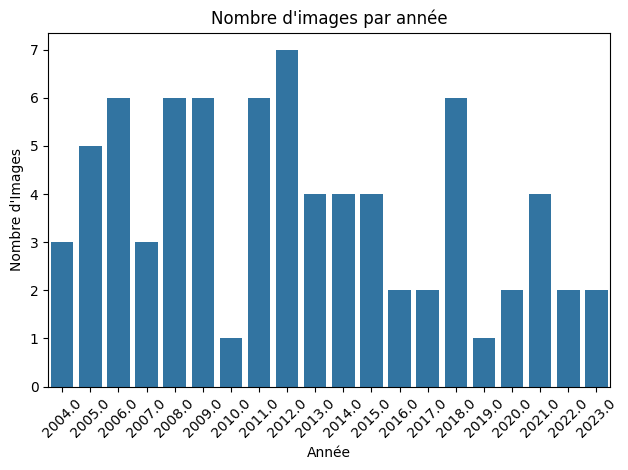

In [28]:
# Nombre d'images par année
sns.countplot(x='Year', data=df_metadata)
plt.title('Nombre d\'images par année')
plt.xlabel('Année')
plt.ylabel('Nombre d\'Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Ainsi, en analysant le nombre d'images disponibles pour chaque année, nous pouvons détecter des tendances dans la production d'images au fil du temps. Cette information pourrait révéler des périodes de haute activité photographique ou des événements spécifiques qui ont conduit à une augmentation des prises de vues.

3. Visualisation par type d'image

Ensuite, nous allons explorer la répartition des images en fonction de différents types, tels que la taille de l'image, l'orientation, et le modèle de l'appareil photo. Cela peut révéler des tendances intéressantes sur les préférences des utilisateurs ou les caractéristiques des images téléchargées.

    1. Visualisation par taille de l'image

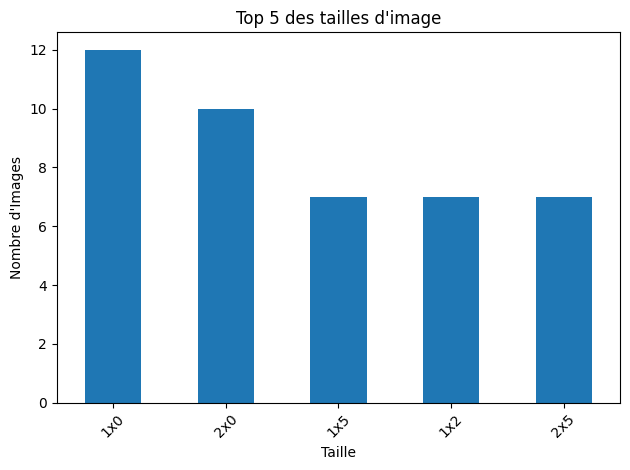

In [29]:
# Visualisation des tailles d'image les plus communes
df_annotations['Image Size'].value_counts().head(5).plot(kind='bar')
plt.title('Top 5 des tailles d\'image')
plt.xlabel('Taille')
plt.ylabel('Nombre d\'Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

    2. Visualisation par orientation de l'image

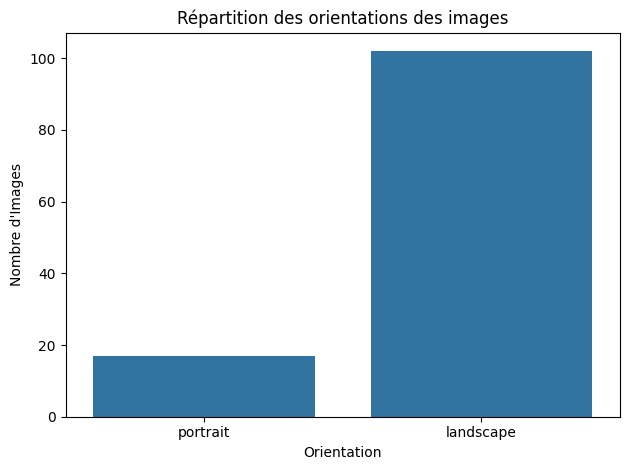

In [30]:
sns.countplot(x='Orientation', data=df_annotations)
plt.title('Répartition des orientations des images')
plt.xlabel('Orientation')
plt.ylabel('Nombre d\'Images')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Nous avons exploré le nombre d'images disponibles selon différents types, tels que la taille de l'image et l'orientation (portrait ou paysage). Ces visualisations fournissent des informations sur la distribution des images dans notre ensemble de données, ce qui peut être utile pour comprendre les préférences des utilisateurs ou les caractéristiques des images téléchargées. Par exemple, une forte préférence pour les images de taille moyenne ou pour l'orientation paysage pourrait indiquer des tendances dans les préférences des utilisateurs ou des caractéristiques des images populaires. Ces informations peuvent être utilisées pour améliorer le système de recommandation en proposant des images similaires à celles préférées par les utilisateurs.

    3. Visualisation par modèle d'appareil photo

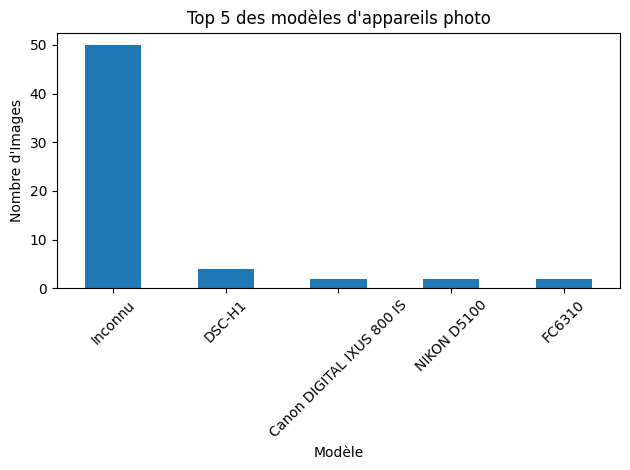

In [31]:
# Top 5 des modèles d'appareils photo
df_metadata['Metadata'].apply(lambda x: x.get('Model', 'Inconnu')).value_counts().head(5).plot(kind='bar')
plt.title('Top 5 des modèles d\'appareils photo')
plt.xlabel('Modèle')
plt.ylabel('Nombre d\'Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Identifier les modèles d'appareils photo les plus couramment utilisés pour capturer les images peut fournir des insights sur la popularité de certains équipements ou sur les choix technologiques des photographes. Cela peut être particulièrement intéressant pour les fabricants d'appareils photo, les revues spécialisées ou les photographes professionnels cherchant à s'aligner sur les tendances du marché.

4. Caractéristiques des couleurs

Nous allons maintenant explorer les caractéristiques des couleurs des images en utilisant les couleurs prédominantes extraites précédemment. Cette visualisation peut révéler des tendances intéressantes sur les palettes de couleurs préférées des utilisateurs ou des motifs récurrents dans les images téléchargées.

    1. Visualisation des couleurs prédominantes

In [ ]:
# Retirer le % pour installer la libraire opencv-python
!pip install opencv-python

Nous limiterons l'affichage à cinq images pour l'exemple, afin d'éviter que l'affichage ne prenne trop de temps et trop de place.

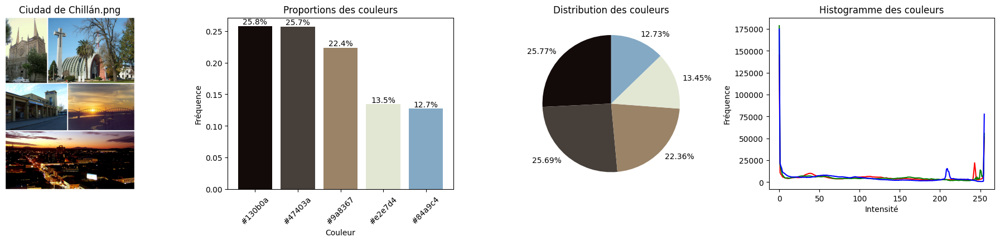

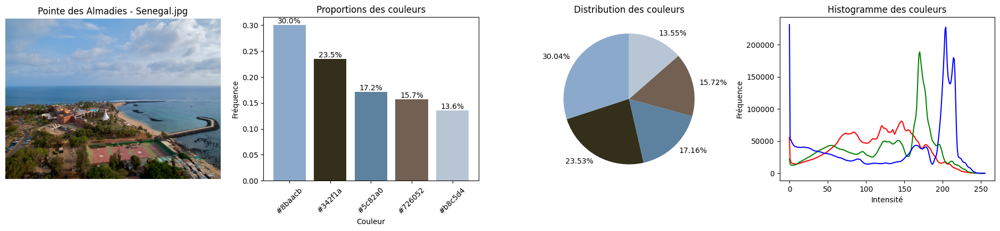

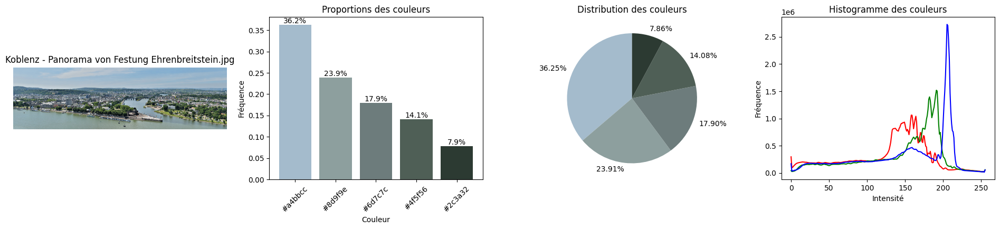

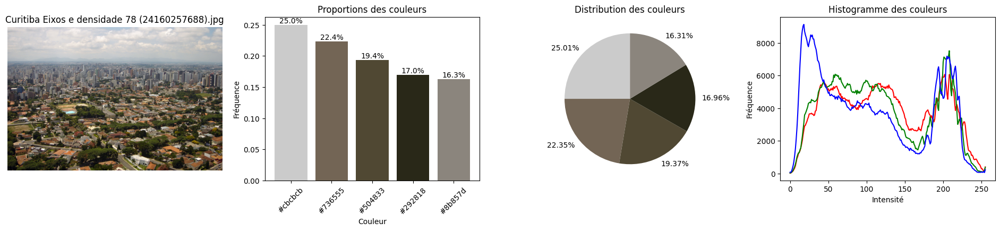

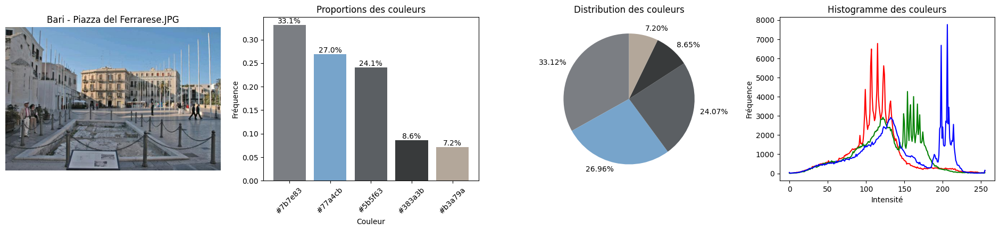

In [32]:
import cv2

def find_dominant_colors(image_path, n_colors=5):
    """
    Trouve les couleurs prédominantes dans une image.
    
    :param image_path: Chemin vers le fichier image.
    :param n_colors: Nombre de couleurs prédominantes à trouver.
    :return: Liste des couleurs prédominantes et leurs proportions.
    """
    with Image.open(image_path) as img:
        img = img.convert('RGB')
        np_pixels = np.array(img.resize((100, 100))).reshape(-1, 3)
    
    kmeans = KMeans(n_clusters=n_colors, n_init=10)
    kmeans.fit(np_pixels)
    
    # Récupération des couleurs prédominantes et de leurs proportions
    unique, counts = np.unique(kmeans.labels_, return_counts=True)
    sort_index = np.argsort(-counts)
    colors = kmeans.cluster_centers_[sort_index].astype(int)
    proportions = counts[sort_index] / sum(counts)
    
    return colors, proportions

def plot_color_distributions(image_path, colors, proportions):
    """
    Affiche l'image originale et les distributions de couleurs.
    
    :param image_path: Chemin vers le fichier image.
    :param colors: Liste des couleurs prédominantes.
    :param proportions: Proportions des couleurs.
    """
    plt.figure(figsize=(24, 4))
    
    # Affichage de l'image originale
    plt.subplot(1, 4, 1)
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_filename, fontsize=12)
    
    # Diagramme à barres avec les proportions
    plt.subplot(1, 4, 2)
    bar_colors = [f'#{c[0]:02x}{c[1]:02x}{c[2]:02x}' for c in colors]
    plt.bar(range(len(colors)), proportions, color=bar_colors)
    plt.xticks(range(len(colors)), labels=bar_colors, rotation=45)
    plt.xlabel("Couleur")
    plt.ylabel("Fréquence")
    for i, prop in enumerate(proportions):
        plt.text(i, prop, f'{prop*100:.1f}%', ha='center', va='bottom')
    plt.title("Proportions des couleurs")
    
    # Diagramme circulaire avec pourcentages
    plt.subplot(1, 4, 3)
    plt.pie(proportions, labels=[f'{p*100:.2f}%' for p in proportions], colors=bar_colors, startangle=90)
    plt.title("Distribution des couleurs")
    
    # Histogramme des couleurs
    plt.subplot(1, 4, 4)
    img = np.array(img)
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
    plt.title('Histogramme des couleurs')
    plt.xlabel('Intensité')
    plt.ylabel('Fréquence')
    
    plt.show()

# Itération sur chaque image de la collection
index = 0
for image_filename in os.listdir(IMAGES_DIR):
    image_path = os.path.join(IMAGES_DIR, image_filename)
    colors, proportions = find_dominant_colors(image_path)
    plot_color_distributions(image_path, colors, proportions)
    
    index += 1
    
    if(index == 5):
        break

Pour chaque image, nous avons généré plusieurs visualisations pour mettre en évidence les couleurs dominantes :
- **Diagrammes à barres et circulaires** : Ces visualisations montrent les couleurs dominantes identifiées dans chaque image, permettant une compréhension rapide des palettes de couleurs prédominantes. Le diagramme à barres montre la fréquence ou la proportion de chaque couleur dominante, tandis que le diagramme circulaire donne un aperçu visuel de la répartition des couleurs.
- **Histogramme des couleurs** : L'histogramme complète les diagrammes en offrant une vue détaillée de la répartition des intensités pour chaque canal de couleur (rouge, vert, bleu) dans l'image. Cela aide à comprendre la luminosité, le contraste et la saturation générale de l'image.

Ces visualisations sont utiles pour analyser les préférences de couleurs dans les images, ce qui peut être pertinent pour des recommandations basées sur des palettes de couleurs similaires ou des préférences de couleurs des utilisateurs. Les diagrammes à barres et circulaires offrent une vue d'ensemble rapide, tandis que l'histogramme fournit des détails plus granulaires sur la composition des couleurs dans chaque image.

In [33]:
def visualize_user_preferences(user_id, users_preferences_df, df_metadata, df_annotations):
    """
    Visualise les préférences d'un utilisateur spécifié en termes de 
    nombre d'images par année, tailles d'images, orientations, et modèles d'appareil photo.
    
    :param user_id: ID de l'utilisateur à visualiser.
    :param users_preferences_df: DataFrame contenant les préférences des utilisateurs.
    :param df_metadata: DataFrame contenant les métadonnées des images.
    :param df_annotations: DataFrame contenant les annotations des images.
    """
    # Récupération des images favorites de l'utilisateur
    user_favorites = users_preferences_df.loc[users_preferences_df['user_id'] == user_id, 'Favorite Images'].iloc[0]
    
    # Filtrage des métadonnées et annotations pour ces images
    favorite_metadata = df_metadata[df_metadata['Filename'].isin(user_favorites)].copy()
    favorite_annotations = df_annotations[df_annotations['Filename'].isin(user_favorites)].copy()
    
    # Extraction de l'année pour chaque image favorite
    favorite_metadata['Year'] = favorite_metadata['Metadata'].apply(lambda x: datetime.strptime(x.get('DateTime', '1900:01:01 00:00:00'), '%Y:%m:%d %H:%M:%S').year if 'DateTime' in x else None)
    
    # Convertion des années en entiers et suppression des valeurs None
    favorite_metadata.dropna(subset=['Year'], inplace=True)
    favorite_metadata['Year'] = favorite_metadata['Year'].astype(int)
    
    # Création d'une figure avec des subplots
    fig, axs = plt.subplots(2, 2, figsize=(16, 12))
    
    # Visualisation du nombre d'images par année
    # Probable d'avoir un nombre d'images nul pour certaines années (pas de données EXIF)
    sns.countplot(x='Year', data=favorite_metadata, ax=axs[0, 0])
    axs[0, 0].set_title('Nombre d\'images par année pour l\'utilisateur {}'.format(user_id))
    axs[0, 0].set_xlabel('Année')
    axs[0, 0].set_ylabel('Nombre d\'Images')
    axs[0, 0].tick_params(axis='x', rotation=45)
    
    # Visualisation des tailles d'image
    favorite_annotations['Image Size'].value_counts().plot(kind='bar', ax=axs[0, 1])
    axs[0, 1].set_title('Préférences de tailles d\'images pour l\'utilisateur {}'.format(user_id))
    axs[0, 1].set_xlabel('Taille')
    axs[0, 1].set_ylabel('Nombre d\'Images')
    axs[0, 1].tick_params(axis='x', rotation=45)
    
    # Visualisation des orientations
    sns.countplot(x='Orientation', data=favorite_annotations, ax=axs[1, 0])
    axs[1, 0].set_title('Préférences d\'orientation pour l\'utilisateur {}'.format(user_id))
    axs[1, 0].set_xlabel('Orientation')
    axs[1, 0].set_ylabel('Nombre d\'Images')
    
    # Visualisation des modèles d'appareil photo
    favorite_metadata['Metadata'].apply(lambda x: x.get('Model', 'Inconnu')).value_counts().plot(kind='bar', ax=axs[1, 1])
    axs[1, 1].set_title('Préférences de modèles d\'appareil photo pour l\'utilisateur {}'.format(user_id))
    axs[1, 1].set_xlabel('Modèle')
    axs[1, 1].set_ylabel('Nombre d\'Images')
    axs[1, 1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Itération sur chaque image de la collection de l'utilisateur
    for image_filename in user_favorites:
        image_path = os.path.join(IMAGES_DIR, image_filename)
        colors, proportions = find_dominant_colors(image_path)
        plot_color_distributions(image_path, colors, proportions)

/tmp/ipykernel_56905/2183596837.py:56: UserWarning: Glyph 0 ( ) missing from current font.
  plt.tight_layout()
/home/fallcon/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 0 ( ) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


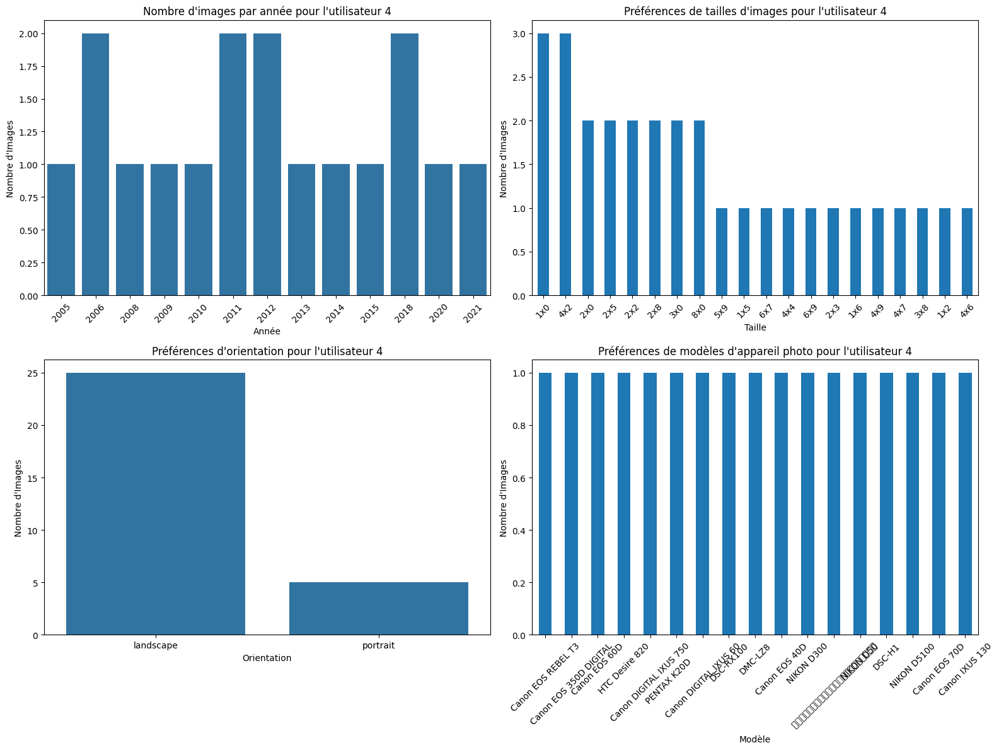

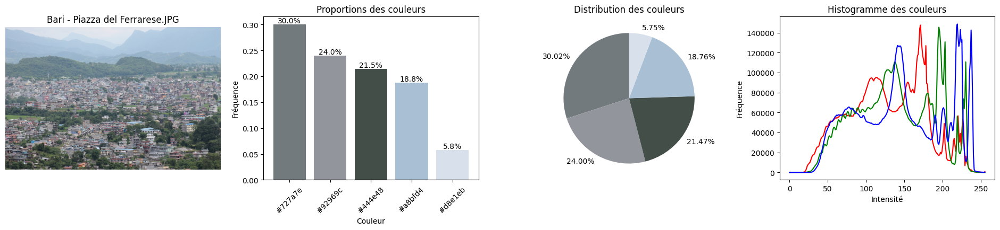

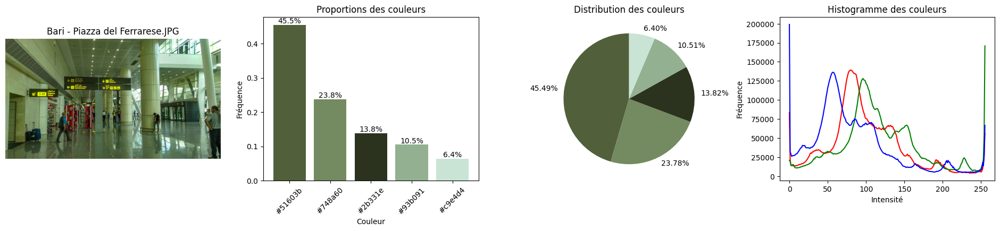

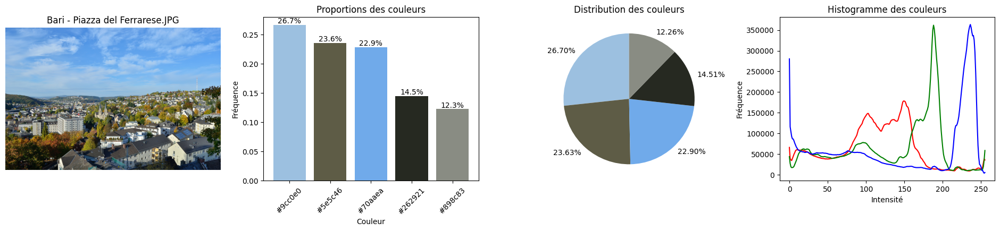

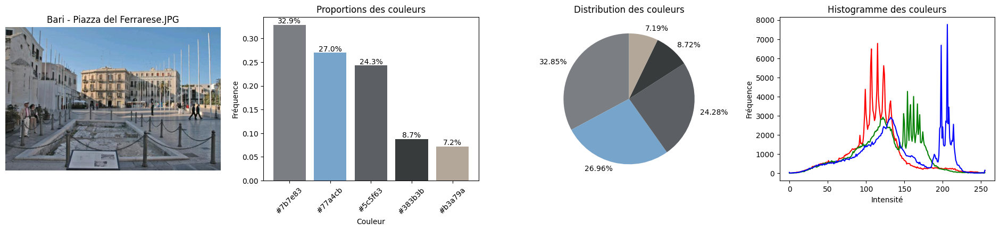

...

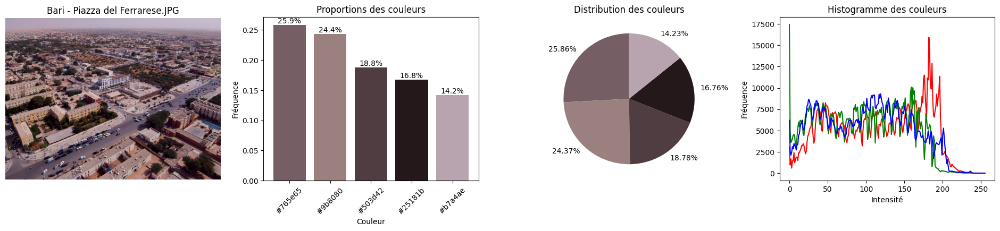

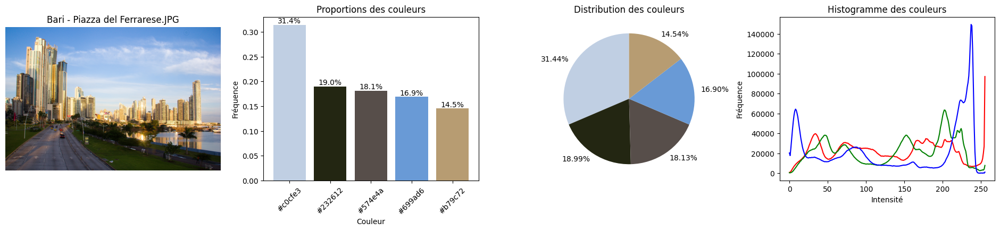

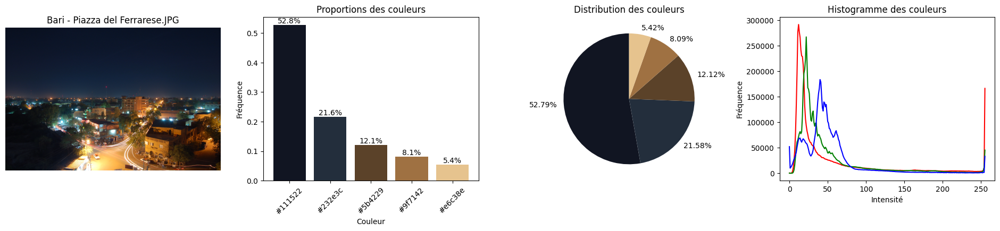

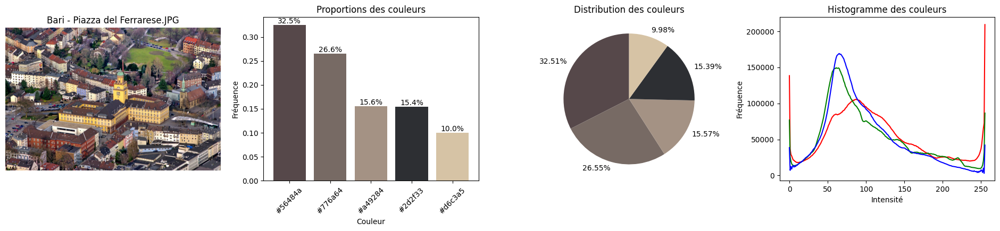

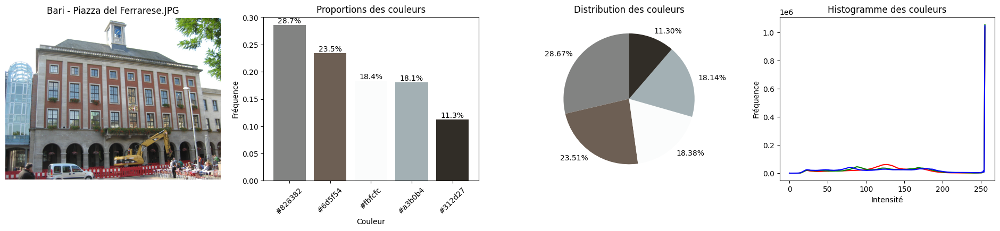

In [34]:
selected_user = int(input("Entrez l'ID de l'utilisateur à visualiser : "))
if selected_user in users_preferences_df['user_id'].values:
    visualize_user_preferences(selected_user, users_preferences_df, df_metadata, df_annotations)
else:
    print("Utilisateur non trouvé. Veuillez réessayer avec un autre ID.")

# Système de recommandation

Êtes-vous maintenant prêt à recommander des images à un utilisateur ? Dans cette tâche, votre objectif est de construire le système de recommandation. Quelle approche avez-vous décidé de prendre ? Filtrage collaboratif, basé sur le contenu ou une approche hybride ? Pour chaque utilisateur, êtes-vous maintenant en mesure de construire une profil ? Quel type d'information avez-vous utilisé pour établir un profil d'utilisateur profil ? Qu'est-ce qui manque ? Quelles sont les limites de votre proposition ?


#### Réponses
Nous avons les prérequis nécessaires au système de recommandation, notamment un système d'utilisateurs avec leurs préférences, un système de tagging d'images, de propriétés d'images, et leur analyse statistique. Nous avons décidé de nous baser sur un système de double filtrage pour la recommandation en se basant sur une participation de l'utilisateur qui doit indiquer sur un ensemble d'images ce qu'il aime ou non. Il aura la possibilité de continuer autant qu'il le souhaite (et dans la limite des images disponibles) afin d'améliorer toujours plus la précision.

Le double filtrage fera usage d'un système de clustering pour prédire les images recommandées pour l'utilisateur en fonction de ses interactions. Ensuite, nous soumettrons cette sélection d'image à un algorithme de classification afin de déterminer si parmi ces dernières, une image serait détectée comme potentiellement inadaptée aux goûts de l'utilisateur.

## Préparation des données

Nous devons d'abord générer un fichier qui regroupe l'ensemble des données récupérées précédemment dans un format utilisable. Nous commencerons par convertir les codes hexadécimaux en couleurs les plus proches possibles, une trop grande variété de nuance sur un si petit échantillon (100 images) empêcherait d'être pertinent, nous baser sur les noms de couleurs en CSS3 pourrait donc être utile.

In [35]:
!pip install scipy
!pip install webcolors

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


Closest match: greenyellow


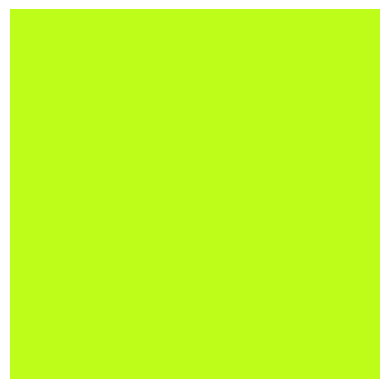

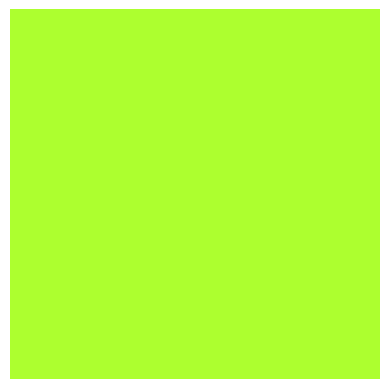

In [36]:
from scipy.spatial import KDTree
from webcolors import (
    CSS3_NAMES_TO_HEX,
    hex_to_rgb,
)

def convert_rgb_to_names(rgb_tuple):
    # a dictionary of all the hex and their respective names in css3
    css3_db = CSS3_NAMES_TO_HEX
    names = []
    rgb_values = []
    for color_name, color_hex in css3_db.items():
        names.append(color_name)
        rgb_values.append(hex_to_rgb(color_hex))
    
    kdt_db = KDTree(rgb_values)
    distance, index = kdt_db.query(rgb_tuple)
    return (names[index], rgb_values[index])

# Testing
test_color = (190,253,25)
result = convert_rgb_to_names(test_color)
print(f'Closest match: {result[0]}')

# Display original color and closest match
import matplotlib.pyplot as plt
import numpy as np

def plot_color(rgb_tuple):
    plt.imshow([[np.array(rgb_tuple)/255]])
    plt.axis('off')
    plt.show()
        
plot_color(test_color)
plot_color(result[1])

Nous devons à présent générer un jeu de données qui représentera les images sous la forme d'un tableau à deux dimensions avec les colonnes "couleurs" et "tags" qui seront eux mêmes des tableaux limités à cinq éléments chacun, qui seront rempli par "None" en cas de valeurs manquantes.

Exemple :
[["green", "red", "blue", "greenyellow", "None"], ["nature", "sky", "people, "park", "river"], "thumbnail", "landscape"]

In [41]:
import json

def categorize_image_size(width, height):
    """
    Catégorise la taille de l'image en petite, moyenne ou grande.
    
    :param width: Largeur de l'image.
    :param height: Hauteur de l'image.
    :return: Catégorie de taille.
    """
    pixels = width * height
    if pixels < 640 * 480:
        return 'small'
    elif pixels <= 1280 * 1024:
        return 'medium'
    else:
        return 'large'

def convert_color_array_to_name(colorarray):
    """
    Convertit un tableau de couleurs hexadécimales en noms de couleurs CSS3.
    
    :param colorarray: Tableau de couleurs hexadécimales.
    :return: Tableau de noms de couleurs CSS3.
    """
    color_names = []
    for color in colorarray:
        colorrgb = hex_to_rgb(color)
        result = convert_rgb_to_names(colorrgb)
        color_names.append(result[0])
    return color_names

def cut_array(arr):
    """
    Coupe un tableau pour qu'il ait une longueur de 5.
    Si la longueur du tableau est inférieure à 5, ajoute des éléments 'None'.
    
    :param arr: Tableau à couper.
    :return: Tableau de longueur 5.
    """
    if len(arr) > 5:
        return arr[:5]
    else:
        arr += ['None'] * (5 - len(arr))
        return arr
    
def process_tagsarray(usertags, autotags):
    """
    Traite les tableaux de tags utilisateur et automatiques.
    Si le nombre de tags utilisateur est inférieur à 5, ajoute des tags automatiques.
    
    :param usertags: Tableau de tags utilisateur.
    :param autotags: Tableau de tags automatiques.
    :return: Tableau de tags.
    """
    tags_array = []
    for tag in usertags:
        tags_array.append(tag.lower())
        
    if(len(tags_array) < 5):
        for tag in autotags:
            index = 0
            first_tag = "0"
            
            while(first_tag.isdigit()):
                first_tag = tag.split(' ')[index]
                index+=1
                
                if(index > 5):
                    break
            
            
            second_tag = tag.split(' ')[-1]
            
            if(len(tags_array) < 4):
                tags_array.append(first_tag.lower())
                tags_array.append(second_tag.lower())
            else:
                tags_array.append(first_tag.lower())                
                
    return tags_array


dataarray = []

with open('annotations.json') as f:
    annotations = json.load(f)
    
    for obj in annotations:
        data = []
             
        dominantcolors_array = convert_color_array_to_name(obj['Dominant Colors'])
        dominantcolors_array = cut_array(dominantcolors_array)
        data.append(dominantcolors_array)
        
        tags_array = process_tagsarray(obj['User Tags'], obj['Auto Tags'])
        tags_array = cut_array(tags_array)
        data.append(tags_array)
        
        width, height = map(int, obj['Image Size'].split('x'))
        data.append(categorize_image_size(width, height))
        data.append(obj['Orientation'])
        
        imgdata = {
            "filename" : obj['Filename'],
            "data" : data
        }
        
        dataarray.append(imgdata)
        
# save as new json under name "images_dataset"
with open('images_dataset.json', 'w') as f:
    json.dump(dataarray, f, indent=4)


# Display the first 5 elements of the new json file
with open('images_dataset.json') as f:
    data = json.load(f)
    for i in range(5):
        print(data[i])


{'filename': 'Ciudad de Chillán.png', 'data': [['darkslategray', 'darkgrey', 'gainsboro', 'grey', 'black'], ['montages', 'chillán', 'None', 'None', 'None'], 'large', 'portrait']}
{'filename': 'Pointe des Almadies - Senegal.jpg', 'data': [['dimgrey', 'lightsteelblue', 'darkslategray', 'darkgrey', 'slategrey'], ['pointe', 'almadies', 'july', 'senegal', 'hotels'], 'large', 'landscape']}
{'filename': 'Koblenz - Panorama von Festung Ehrenbreitstein.jpg', 'data': [['lightsteelblue', 'dimgrey', 'lightslategrey', 'slategrey', 'darkslategray'], ['in', 'koblenz', 'views', 'ehrenbreitstein', 'seilbahn'], 'large', 'landscape']}
{'filename': 'Curitiba Eixos e densidade 78 (24160257688).jpg', 'data': [['lightgray', 'darkolivegreen', 'dimgrey', 'grey', 'black'], ['aerial', 'curitiba', 'None', 'None', 'None'], 'medium', 'landscape']}
{'filename': 'Bari - Piazza del Ferrarese.JPG', 'data': [['grey', 'cornflowerblue', 'darkgrey', 'darkslategray', 'dimgrey'], ['piazza', '(bari)', 'None', 'None', 'None'],

## Recommandation des images en fonction des interactions

Nous utiliserons ici un algorithme de clustering que nous entraînerons sur l'ensemble des images récupérées, il nous permettra de déterminer les images qui pourraient plaire à un utilisateur en fonction d'une image avec laquelle il aurait intéragit positivement en fonction des similitudes.

In [43]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import json

# Sample data
data = []

with open('images_dataset.json') as f:
    raw_dataset = json.load(f)
    
    for entry in raw_dataset:
        data.append(entry['data'])

# Encode categorical features and labels
colorlabel_encoders = [LabelEncoder() for _ in range(len(data[0][0]))]
categorylabel_encoders = [LabelEncoder() for _ in range(len(data[0][1]))]
label_encoders = [LabelEncoder() for _ in range(len(data[0]) - 2)]

encoded_data = []
for i, column in enumerate(zip(*data)):
    if(i < 2):
        if(i == 0):
            encoded_colors = []
            for y, color in enumerate(zip(*column)):
                encoded_data.append(colorlabel_encoders[y].fit_transform(color))
        else:
            encoded_tags = []
            for y, tag in enumerate(zip(*column)):
                encoded_data.append(categorylabel_encoders[y].fit_transform(tag))
    else:
        encoded_data.append(label_encoders[i-2].fit_transform(column))

X = list(zip(*encoded_data))  # Features

# Clustering
k = 2  # Number of clusters
kmeans = KMeans(n_clusters=k, n_init=10)
kmeans.fit(X)
clusters = kmeans.labels_

# Add cluster labels to the original data
data_with_clusters = pd.DataFrame(data, columns=["Color", "Category", "Size", "Type"])
data_with_clusters["Cluster"] = clusters

# Recommendation function
def recommend_items(cluster, data_with_clusters):
    """
    Recommends items from a specific cluster.
    
    :param cluster: Cluster number.
    :param data_with_clusters: Data with cluster labels.
    :return: Recommended items.
    """
    items_in_cluster = data_with_clusters[data_with_clusters["Cluster"] == cluster]
    recommended_items = items_in_cluster.sample(n=3)  # Sample 3 items from the cluster
    return recommended_items

# Returns a list of recommended items based on a sample item
def get_recommandations(sample_item, data_with_clusters, kmeans, label_encoders, colorlabel_encoders, categorylabel_encoders):
    """
    Returns a list of recommended items based on a sample item.
    
    :param sample_item: Sample item attributes.
    :param data_with_clusters: Data with cluster labels.
    :param kmeans: KMeans model.
    :param label_encoders: Label encoders for categorical features.
    :param colorlabel_encoders: Label encoders for color features.
    :param categorylabel_encoders: Label encoders for category features.
    :return: List of recommended items.
    """
    encoded_interaction = []
    for i, column in enumerate(sample_item):
        if(i < 2):
            if(i == 0):
                for y, color in enumerate(column):
                    encoded_interaction.append(colorlabel_encoders[y].transform([color])[0])
            else:
                for y, tag in enumerate(column):
                    encoded_interaction.append(categorylabel_encoders[y].transform([tag])[0])
        else:
            encoded_interaction.append(label_encoders[i-2].transform([column])[0])

    cluster = kmeans.predict([encoded_interaction])[0]
    recommendations = recommend_items(cluster, data_with_clusters)


    reco_list = recommendations.values.tolist()
    reco_list = [sublist[:-1] for sublist in reco_list]
    
    return reco_list
    
# Example usage
sample_item = [['lightgray', 'darkolivegreen', 'dimgrey', 'grey', 'black'], ['aerial', 'curitiba', 'None', 'None', 'None'], 'medium', 'landscape']  # Sample item attributes

recommendations = get_recommandations(sample_item, data_with_clusters, kmeans, label_encoders, colorlabel_encoders, categorylabel_encoders)
print("Recommended items:")
print(recommendations)


Recommended items:
[[['darkslategray', 'darkgrey', 'dimgrey', 'cornflowerblue', 'grey'], ['libreville', '2000s', 'None', 'None', 'None'], 'medium', 'landscape'], [['darkslategray', 'darkgrey', 'gainsboro', 'grey', 'black'], ['montages', 'chillán', 'None', 'None', 'None'], 'large', 'portrait'], [['gainsboro', 'dimgrey', 'darkgrey', 'darkslategray', 'lightslategrey'], ['jena', '2008-05-24', 'views', '(jena)', 'jentower'], 'large', 'landscape']]


Nous pouvons à présent tester la recommandation pour un utilisateur avec ce seul algorithme :

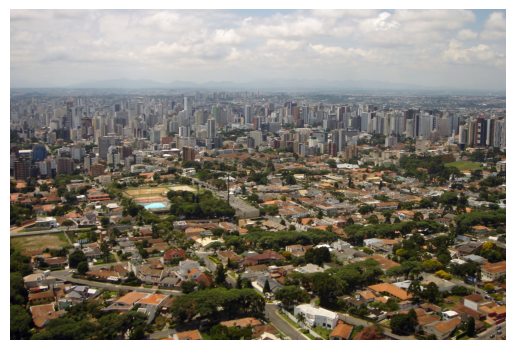

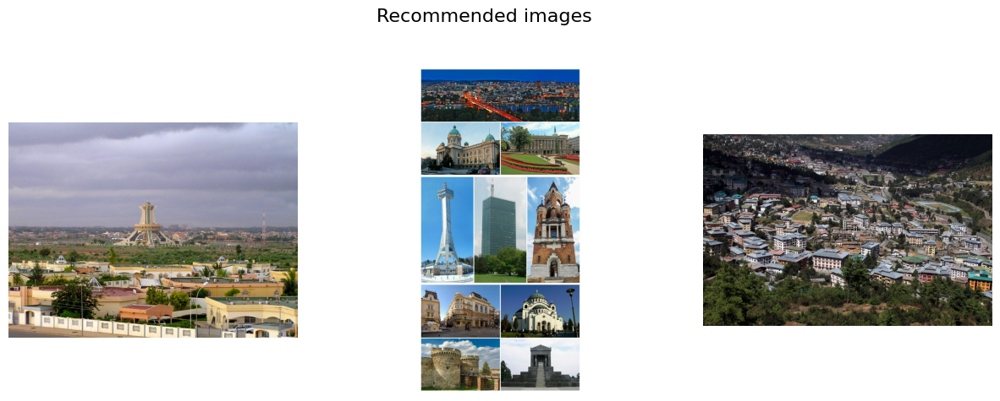

In [46]:
import os
import matplotlib.pyplot as plt
import IPython.display as ipd
import json

def display_image(filename):
    """
    Displays an image from the /images folder based on the filename.
    
    :param filename: Image filename.
    """
        # Clear the output
    ipd.clear_output(wait=True)

    # Display the image
    img = plt.imread(f'images/{filename}')
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
def display_recommandations(recommendations):
    """
    Displays a list of recommended images.
    
    :param recommendations: List of recommended images.
    """
    num_images = len(recommendations)

    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle('Recommended images', fontsize=16, y=1.02)

    # Display each image
    for i, filename in enumerate(recommendations):
        image_path = os.path.join('images', filename)
        img = plt.imread(image_path)

        axs[i].imshow(img)
        axs[i].axis('off')

    plt.show()


selected_img = ''
imgdata = None
raw_dataset = []

with open('images_dataset.json') as f:
    raw_dataset = json.load(f)
    
    for entry in raw_dataset:
        selected_img = entry['filename']
        display_image(selected_img)
        
        answer = input("Do you like this picture ? (y/n)")
        if answer == 'y' or answer == 'yes':
            imgdata = entry['data']
            break
        
if imgdata:
    recommendations = get_recommandations(imgdata, data_with_clusters, kmeans, label_encoders, colorlabel_encoders, categorylabel_encoders)

    # Find and display the recommended images from dataset
    recommandations_filepaths = []
    
    for reco in recommendations:
        for entry in raw_dataset:
            if entry['data'] == reco:
                recommandations_filepaths.append(entry['filename'])
                break
            
    display_recommandations(recommandations_filepaths)

On remarque que l'algorithme reste plutôt pertinent, bien que cela soit perfectible. Les tags utilisateurs influencent beaucoup la précision de la recommandation, ainsi plus les tags seront pertinents et plus l'algorithme proposera de bons groupes d'images.

### Algorithme de classification

Nous allons à présent affiner ces résultats en permettant à l'utilisateur de réellement préciser ses goûts à travers un système qui rappellera celui des applications de rencontres bien connues, le système de "swipe", où l'on aime une image en appuyant à gauche et on aime pas une image en appuyant à droite. L'utilisateur devra au minimum faire cela pour 30 images afin d'améliorer la précision. Il pourra ensuite continuer autant qu'il le souhaite, ou arrêter directement.

L'ensemble des images sont utilisées dans le jeu de données en X, tandis que les labels Y sont initialisés à un état neutre (label "Neutral") qui sera changé au moment où l'utilisateur swipera l'image à gauche ou à droite.

In [ ]:
!pip install pynput==1.7.6

Press 'left' if you like the picture, 'right' if you don't, or 'esc' to exit (you can now stop at any moment)


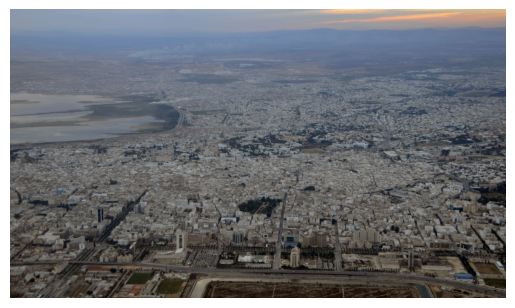

Escape key pressed, ending program
[[['darkslategray', 'darkgrey', 'gainsboro', 'grey', 'black'], ['montages', 'chillán', 'None', 'None', 'None'], 'large', 'portrait'], [['dimgrey', 'lightsteelblue', 'darkslategray', 'darkgrey', 'slategrey'], ['pointe', 'almadies', 'july', 'senegal', 'hotels'], 'large', 'landscape'], [['lightsteelblue', 'dimgrey', 'lightslategrey', 'slategrey', 'darkslategray'], ['in', 'koblenz', 'views', 'ehrenbreitstein', 'seilbahn'], 'large', 'landscape'], [['lightgray', 'darkolivegreen', 'dimgrey', 'grey', 'black'], ['aerial', 'curitiba', 'None', 'None', 'None'], 'medium', 'landscape'], [['grey', 'cornflowerblue', 'darkgrey', 'darkslategray', 'dimgrey'], ['piazza', '(bari)', 'None', 'None', 'None'], 'small', 'landscape'], [['darkolivegreen', 'silver', 'black', 'rosybrown', 'dimgrey'], ['algiers', 'algiers', 'None', 'None', 'None'], 'large', 'landscape'], [['paleturquoise', 'dimgrey', 'darkslategray', 'darkgrey', 'lightskyblue'], ['altmarkt', '(bottrop)', 'houses', 

In [59]:
from pynput import keyboard

data = data
y_labels = ["Neutral" for i in range(len(data)-1)]  # Initial labels are all "Neutral
current_index = 0
exited = False

def on_press(key):
    global y_labels, exited, current_index
    try:
        if key == keyboard.Key.esc:
            if(len(y_labels) >= 30):
                print('Escape key pressed, ending program')
                exited = True
                return False  # Stop listener
        elif key == keyboard.Key.left:
            print('You liked this picture')
            y_labels[current_index] = "Liked"
            return False  # Stop listener
        elif key == keyboard.Key.right:
            print('You did not like this picture')
            y_labels[current_index] = "NotLiked"
            return False  # Stop listener
    except AttributeError:
        pass

def display_image_alt(filename):
    """
    Displays an image from the /images folder based on the filename.
    
    :param filename: Image filename.
    """
    global current_index
    
    # Clear the output
    ipd.clear_output(wait=True)

    # Display the image
    if(current_index < 30):
        print(f"Press 'left' if you like the picture, 'right' if you don't (you need to continue for {30 - current_index} more images)")
    else:
        print("Press 'left' if you like the picture, 'right' if you don't, or 'esc' to exit (you can now stop at any moment)")
    img = plt.imread(f'images/{filename}')
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
    
# Starting to create the dataset
with open('images_dataset.json') as f:
    raw_dataset = json.load(f)

    for entry in raw_dataset:
        current_entry = entry
        selected_img = entry['filename']
        
        display_image_alt(selected_img)

        # Start the keyboard listener
        with keyboard.Listener(on_press=on_press) as listener:
            listener.join()

        if exited == True:
            # remove last entry from data if user stopped the program
            data.pop()
            break
        
        current_index += 1
        
    print(data)
    print(y_labels)

Une fois le jeu de données récolté, nous pouvons à présent entraîner notre modèle dessus. Nous utiliserons SVC, une implémentation de la méthode des machines à vecteurs de support (SVM), qui est une technique de classification basée sur la recherche d'un hyperplan séparant les données de différentes classes.

In [62]:
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Encode categorical features and labels
colorlabel_encoders = [LabelEncoder() for _ in range(len(data[0][0]))]
categorylabel_encoders = [LabelEncoder() for _ in range(len(data[0][1]))]
label_encoders = [LabelEncoder() for _ in range(len(data[0]) - 2)]

encoded_data = []
for i, column in enumerate(zip(*data)):
    if(i < 2):
        if(i == 0):
            encoded_colors = []
            for y, color in enumerate(zip(*column)):
                encoded_data.append(colorlabel_encoders[y].fit_transform(color))
        else:
            encoded_tags = []
            for y, tag in enumerate(zip(*column)):
                encoded_data.append(categorylabel_encoders[y].fit_transform(tag))
    else:
        encoded_data.append(label_encoders[i-2].fit_transform(column))

X = list(zip(*encoded_data))  # Features
y = y_labels  # Labels

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y)

# Train the logistic regression classifier
classifier = svm.SVC()
classifier.fit(X_train, y_train)

# Predictions
y_pred = classifier.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

66
66
Accuracy: 0.4117647058823529


### Système final

Nous pouvons à présent faire intéragir l'utilisateur avec des images et combiner nos deux algorithmes pour faire une recommandation pertinente :

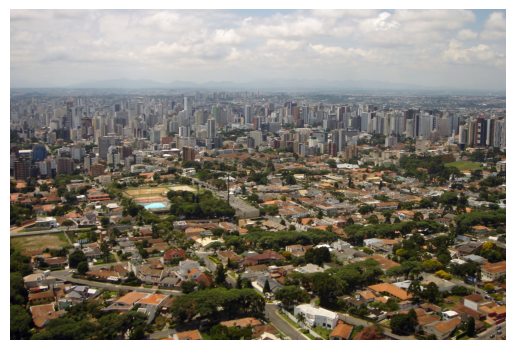

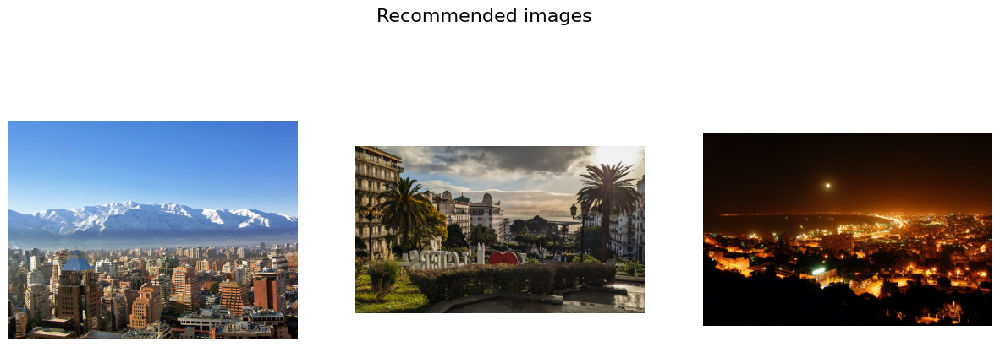

In [64]:
selected_img = ''
imgdata = None
raw_dataset = []

def display_image(filename):
    """
    Displays an image from the /images folder based on the filename.
    
    :param filename: Image filename.
    """
        # Clear the output
    ipd.clear_output(wait=True)

    # Display the image
    img = plt.imread(f'images/{filename}')
    plt.imshow(img)
    plt.axis('off')
    plt.show()

def refine_recommandations(reco_list):
    """
    Refines the list of recommendations based on the classifier predictions.
    
    :param reco_list: List of recommendations.
    :return: Refined list of recommendations.
    """
    global label_encoders, colorlabel_encoders, categorylabel_encoders, classifier
    refined_list = []
    
    for prediction in reco_list:
        encoded_array = []
        for i, column in enumerate(prediction):
            if(i < 2):
                if(i == 0):
                    for y, color in enumerate(column):
                        encoded_array.append(colorlabel_encoders[y].transform([color])[0])
                else:
                    for y, tag in enumerate(column):
                        encoded_array.append(categorylabel_encoders[y].transform([tag])[0])
            else:
                encoded_array.append(label_encoders[i-2].transform([column])[0])

        prediction_res = classifier.predict([encoded_array])[0]
        
        if prediction_res == 'Liked':
            refined_list.append(prediction)
    
    return refined_list

def display_recommandations(recommendations):
    """
    Displays a list of recommended images.
    
    :param recommendations: List of recommended images.
    """
    num_images = len(recommendations)

    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle('Recommended images', fontsize=16, y=1.02)

    # Display each image
    for i, filename in enumerate(recommendations):
        image_path = os.path.join('images', filename)
        img = plt.imread(image_path)

        if num_images == 1:  # If there's only one image, use axs instead of axs[i]
            axs.imshow(img)
            axs.axis('off')
        else:
            axs[i].imshow(img)
            axs[i].axis('off')

    plt.show()

with open('images_dataset.json') as f:
    raw_dataset = json.load(f)
    
    for entry in raw_dataset:
        selected_img = entry['filename']
        display_image(selected_img)
        
        answer = input("Do you like this picture ? (y/n)")
        if answer == 'y' or answer == 'yes':
            imgdata = entry['data']
            break
        
if imgdata:
    recommendations = get_recommandations(imgdata, data_with_clusters, kmeans, label_encoders, colorlabel_encoders, categorylabel_encoders)
    refined_rec_list = refine_recommandations(recommendations)

    # Find and display the recommended images from dataset
    recommandations_filepaths = []
    
    # If refined recommendations are found, display them
    if(len(refined_rec_list) > 0):
        for reco in refined_rec_list:
            for entry in raw_dataset:
                if entry['data'] == reco:
                    if(entry['filename'] not in recommandations_filepaths and entry['filename'] != selected_img):
                        recommandations_filepaths.append(entry['filename'])
                        break
        
        # If not enough refined recommendations are found, display original recommendations
        if(len(recommandations_filepaths) == 0):
            print("No refined recommendations found, displaying original recommendations.")
            for reco in recommendations:
                for entry in raw_dataset:
                    if entry['data'] == reco:
                        if(entry['filename'] not in recommandations_filepaths and entry['filename'] != selected_img):
                            recommandations_filepaths.append(entry['filename'])
                            break
    # If no refined recommendations are found, display original recommendations
    else:
        print("No refined recommendations found, displaying original recommendations.")
        for reco in recommendations:
            for entry in raw_dataset:
                if entry['data'] == reco:
                     if(entry['filename'] not in recommandations_filepaths and entry['filename'] != selected_img):
                        recommandations_filepaths.append(entry['filename'])
                        break

    display_recommandations(recommandations_filepaths)

Note: Il peut parfois subvenir une erreur lors de la prédiction dû à un label trop unique, cela est causé par la récupération de labels automatiquement qui ne fait pas l'objet d'un nettoyage et d'une généralisation suffisants. Idéalement, chaque image devrait posséder des tags donnés par des utilisateurs qui sont les plus généraux possibles (exemple: capitale et ville au lieu de Paris).